# VGGT Demo - COLMAP Integration (Simplified)

This notebook demonstrates VGGT's integration with COLMAP for 3D reconstruction and sparse reconstruction output generation.

## Features
- Load VGGT model for 3D scene reconstruction
- Generate camera poses and depth maps
- Convert predictions to COLMAP format
- Save sparse reconstruction in COLMAP standard format
- Export point clouds for visualization

In [1]:
# Configure matplotlib for high-resolution outputs
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300

In [2]:
# Import required packages
import random
import numpy as np
import glob
import os
import copy
import torch
import torch.nn.functional as F
from pathlib import Path
import trimesh
import matplotlib.pyplot as plt

print("Basic imports successful")

Basic imports successful


In [3]:
# Import VGGT modules
try:
    from vggt.models.vggt import VGGT
    from vggt.utils.load_fn import load_and_preprocess_images_square
    from vggt.utils.pose_enc import pose_encoding_to_extri_intri
    from vggt.utils.geometry import unproject_depth_map_to_point_map
    from vggt.utils.helper import create_pixel_coordinate_grid, randomly_limit_trues
    print("VGGT imports successful")
except ImportError as e:
    print(f"VGGT import error: {e}")
    raise

/Users/speed/Downloads/Paper2Agent/VGGT_Agent/repo/vggt-env/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


VGGT imports successful


In [4]:
# Try to import COLMAP modules (optional for this simplified demo)
try:
    import pycolmap
    from vggt.dependency.np_to_pycolmap import batch_np_matrix_to_pycolmap_wo_track
    COLMAP_AVAILABLE = True
    print("COLMAP imports successful")
except ImportError as e:
    print(f"COLMAP import warning: {e}")
    print("Will proceed without COLMAP integration")
    COLMAP_AVAILABLE = False

COLMAP import warning: No module named 'pycolmap'
Will proceed without COLMAP integration


In [5]:
# Set seed for reproducibility
seed = 42
np.random.seed(seed)
torch.manual_seed(seed)
random.seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
print(f"Setting seed as: {seed}")

Setting seed as: 42


In [6]:
# Set device and data type
device = "cuda" if torch.cuda.is_available() else "cpu"
if device == "cuda":
    try:
        dtype = torch.bfloat16 if torch.cuda.get_device_capability()[0] >= 8 else torch.float16
    except:
        dtype = torch.float16
else:
    dtype = torch.float32

print(f"Using device: {device}")
print(f"Using dtype: {dtype}")

Using device: cpu
Using dtype: torch.float32


In [7]:
# Load VGGT model
print("Loading VGGT model...")
try:
    # Use the alternative loading method that works reliably
    model = VGGT()
    _URL = "https://huggingface.co/facebook/VGGT-1B/resolve/main/model.pt"
    model.load_state_dict(torch.hub.load_state_dict_from_url(_URL))
    model.eval()
    model = model.to(device)
    print("Model loaded successfully!")
except Exception as e:
    print(f"Model loading failed: {e}")
    raise

Loading VGGT model...


Model loaded successfully!


In [8]:
# Find and load example images
examples_dir = "/Users/speed/Downloads/Paper2Agent/VGGT_Agent/repo/vggt/examples"
scene_dirs = [d for d in Path(examples_dir).iterdir() if d.is_dir()]

if not scene_dirs:
    raise ValueError(f"No scene directories found in {examples_dir}")

# Use the first available scene
scene_dir = scene_dirs[0]
images_dir = scene_dir / "images"

if not images_dir.exists():
    raise ValueError(f"No images directory found in {scene_dir}")

image_paths = list(images_dir.glob("*"))
image_paths = [p for p in image_paths if p.suffix.lower() in ['.jpg', '.jpeg', '.png']]

if len(image_paths) == 0:
    raise ValueError(f"No valid images found in {images_dir}")

print(f"Found {len(image_paths)} images in {scene_dir.name}")
print(f"Image paths: {[p.name for p in image_paths[:5]]}{'...' if len(image_paths) > 5 else ''}")

# Create output directory
output_dir = f"notebooks/demo_colmap/{scene_dir.name}_reconstruction"
os.makedirs(output_dir, exist_ok=True)
print(f"Output directory: {output_dir}")

Found 8 images in room
Image paths: ['no_overlap_8.jpg', 'no_overlap_2.jpg', 'no_overlap_3.jpg', 'no_overlap_1.png', 'no_overlap_4.jpg']...
Output directory: notebooks/demo_colmap/room_reconstruction


In [9]:
# Load and preprocess images
img_load_resolution = 1024
vggt_fixed_resolution = 518

image_path_strs = [str(p) for p in image_paths]
print(f"Loading {len(image_path_strs)} images...")

images, original_coords = load_and_preprocess_images_square(image_path_strs, img_load_resolution)
images = images.to(device)
original_coords = original_coords.to(device)
print(f"Loaded images with shape: {images.shape}")

Loading 8 images...


Loaded images with shape: torch.Size([8, 3, 1024, 1024])


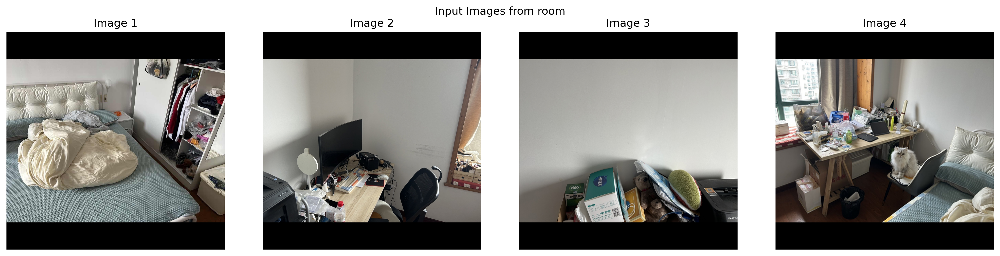

In [10]:
# Display input images
num_images = min(4, len(images))
fig, axes = plt.subplots(1, num_images, figsize=(16, 4))
if num_images == 1:
    axes = [axes]

for i in range(num_images):
    img_np = images[i].cpu().permute(1, 2, 0).numpy()
    img_np = np.clip(img_np, 0, 1)
    axes[i].imshow(img_np)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

plt.suptitle(f"Input Images from {scene_dir.name}")
plt.tight_layout()
plt.show()

In [11]:
# Define the VGGT inference function
def run_VGGT(model, images, dtype, resolution=518):
    """Run VGGT inference on input images"""
    assert len(images.shape) == 4
    assert images.shape[1] == 3

    # Resize to VGGT resolution
    images_resized = F.interpolate(images, size=(resolution, resolution), mode="bilinear", align_corners=False)

    with torch.no_grad():
        with torch.cuda.amp.autocast(dtype=dtype, enabled=(device == "cuda")):
            images_batched = images_resized[None]  # add batch dimension
            aggregated_tokens_list, ps_idx = model.aggregator(images_batched)

        # Predict Cameras
        pose_enc = model.camera_head(aggregated_tokens_list)[-1]
        # Extrinsic and intrinsic matrices, following OpenCV convention (camera from world)
        extrinsic, intrinsic = pose_encoding_to_extri_intri(pose_enc, images_resized.shape[-2:])
        # Predict Depth Maps
        depth_map, depth_conf = model.depth_head(aggregated_tokens_list, images_batched, ps_idx)

    extrinsic = extrinsic.squeeze(0).cpu().numpy()
    intrinsic = intrinsic.squeeze(0).cpu().numpy()
    depth_map = depth_map.squeeze(0).cpu().numpy()
    depth_conf = depth_conf.squeeze(0).cpu().numpy()
    
    return extrinsic, intrinsic, depth_map, depth_conf

In [12]:
# Run VGGT inference
print("Running VGGT inference...")
extrinsic, intrinsic, depth_map, depth_conf = run_VGGT(model, images, dtype, vggt_fixed_resolution)
print(f"Extrinsic shape: {extrinsic.shape}")
print(f"Intrinsic shape: {intrinsic.shape}")
print(f"Depth map shape: {depth_map.shape}")
print(f"Depth confidence shape: {depth_conf.shape}")

Running VGGT inference...


/var/folders/7q/tx7m0tg12m5cgq7k8z8q2dzw0000gn/T/ipykernel_99444/3041761548.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=dtype, enabled=(device == "cuda")):


Extrinsic shape: (8, 3, 4)
Intrinsic shape: (8, 3, 3)
Depth map shape: (8, 518, 518, 1)
Depth confidence shape: (8, 518, 518)


In [13]:
# Generate 3D point clouds
print("Generating 3D point clouds...")
points_3d = unproject_depth_map_to_point_map(depth_map, extrinsic, intrinsic)
print(f"3D points shape: {points_3d.shape}")

Generating 3D point clouds...
3D points shape: (8, 518, 518, 3)


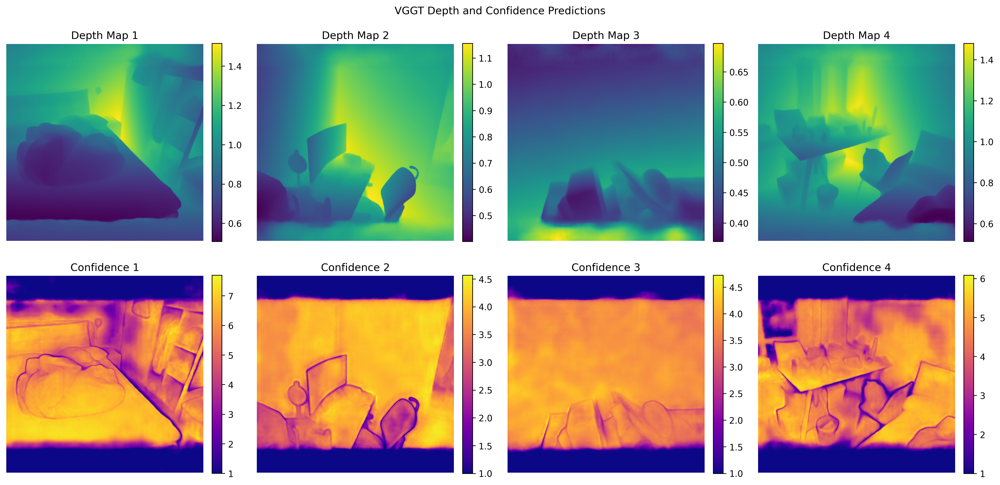

In [14]:
# Visualize depth maps and confidence maps
num_views = min(4, len(depth_map))
fig, axes = plt.subplots(2, num_views, figsize=(16, 8))
if num_views == 1:
    axes = axes.reshape(2, 1)

for i in range(num_views):
    # Depth map
    im1 = axes[0, i].imshow(depth_map[i], cmap='viridis')
    axes[0, i].set_title(f"Depth Map {i+1}")
    axes[0, i].axis('off')
    plt.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)
    
    # Confidence map
    im2 = axes[1, i].imshow(depth_conf[i], cmap='plasma')
    axes[1, i].set_title(f"Confidence {i+1}")
    axes[1, i].axis('off')
    plt.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)

plt.suptitle("VGGT Depth and Confidence Predictions")
plt.tight_layout()
plt.show()

In [15]:
# Process for COLMAP format (simplified approach without Bundle Adjustment)
conf_thres_value = 5.0
max_points_for_colmap = 100000  # randomly sample 3D points
shared_camera = False  # feedforward manner doesn't support shared camera
camera_type = "PINHOLE"  # feedforward manner only supports PINHOLE camera

image_size = np.array([vggt_fixed_resolution, vggt_fixed_resolution])
num_frames, height, width, _ = points_3d.shape

# Generate RGB colors for points
points_rgb = F.interpolate(
    images, size=(vggt_fixed_resolution, vggt_fixed_resolution), mode="bilinear", align_corners=False
)
points_rgb = (points_rgb.cpu().numpy() * 255).astype(np.uint8)
points_rgb = points_rgb.transpose(0, 2, 3, 1)

print(f"Points RGB shape: {points_rgb.shape}")
print(f"Processing {num_frames} frames at resolution {height}x{width}")

Points RGB shape: (8, 518, 518, 3)
Processing 8 frames at resolution 518x518


In [16]:
# Create pixel coordinates and apply confidence filtering
points_xyf = create_pixel_coordinate_grid(num_frames, height, width)
print(f"Pixel coordinates shape: {points_xyf.shape}")

# Apply confidence mask
conf_mask = depth_conf >= conf_thres_value
# Randomly limit to max points for COLMAP
conf_mask = randomly_limit_trues(conf_mask, max_points_for_colmap)

# Filter points based on confidence
filtered_points_3d = points_3d[conf_mask]
filtered_points_xyf = points_xyf[conf_mask]
filtered_points_rgb = points_rgb[conf_mask]

print(f"Filtered to {len(filtered_points_3d)} high-confidence points")
print(f"Confidence threshold: {conf_thres_value}")

Pixel coordinates shape: (8, 518, 518, 3)
Filtered to 100000 high-confidence points
Confidence threshold: 5.0


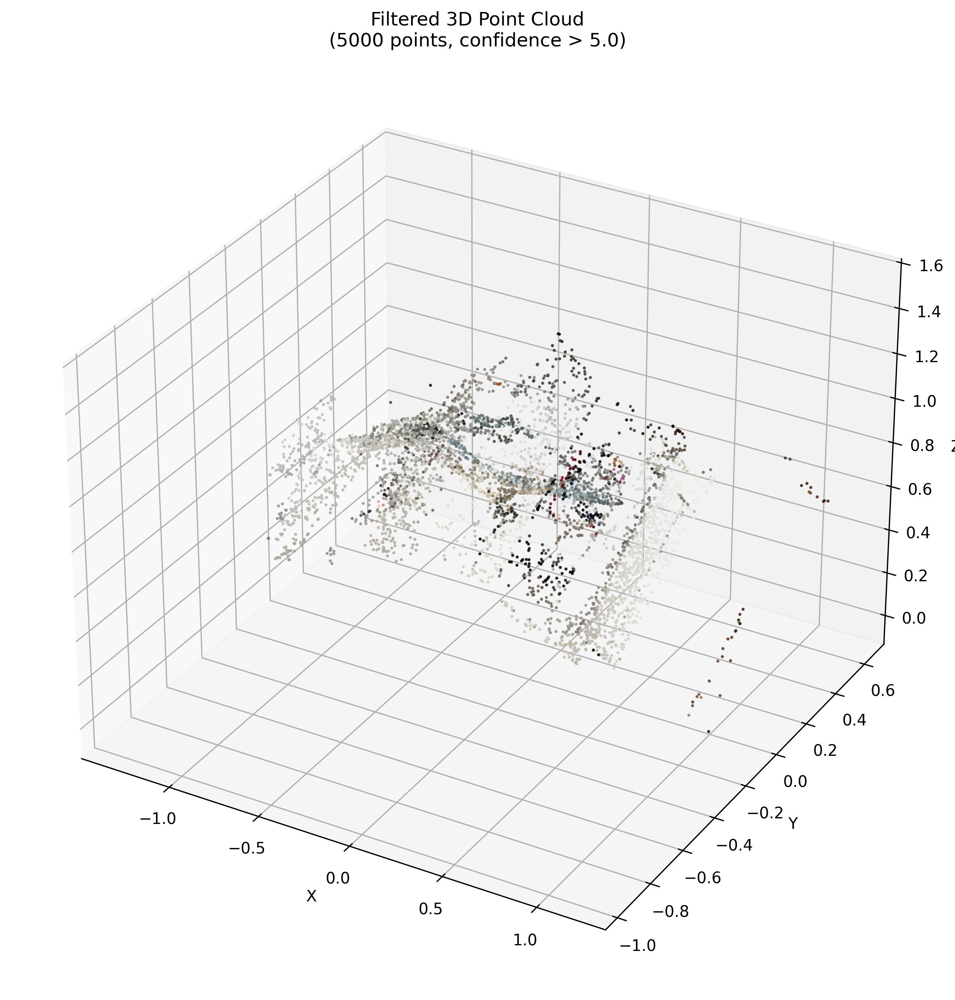

Visualized 5000 points from filtered point cloud


In [17]:
# Visualize filtered 3D points
if len(filtered_points_3d) > 0:
    # Subsample for visualization
    max_vis_points = 5000
    if len(filtered_points_3d) > max_vis_points:
        indices = np.random.choice(len(filtered_points_3d), max_vis_points, replace=False)
        vis_points = filtered_points_3d[indices]
        vis_colors = filtered_points_rgb[indices]
    else:
        vis_points = filtered_points_3d
        vis_colors = filtered_points_rgb
    
    # Create 3D scatter plot
    fig = plt.figure(figsize=(12, 9))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot points with colors
    scatter = ax.scatter(vis_points[:, 0], vis_points[:, 1], vis_points[:, 2], 
                        c=vis_colors/255.0, s=1, alpha=0.8)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'Filtered 3D Point Cloud\n({len(vis_points)} points, confidence > {conf_thres_value})')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Visualized {len(vis_points)} points from filtered point cloud")
else:
    print("No points passed confidence filtering")

In [18]:
# Convert to COLMAP format if available
if COLMAP_AVAILABLE and len(filtered_points_3d) > 0:
    print("Converting to COLMAP format...")
    try:
        reconstruction = batch_np_matrix_to_pycolmap_wo_track(
            filtered_points_3d,
            filtered_points_xyf,
            filtered_points_rgb,
            extrinsic,
            intrinsic,
            image_size,
            shared_camera=shared_camera,
            camera_type=camera_type,
        )
        
        reconstruction_resolution = vggt_fixed_resolution
        print(f"COLMAP reconstruction created successfully")
        print(f"Number of cameras: {len(reconstruction.cameras)}")
        print(f"Number of images: {len(reconstruction.images)}")
        print(f"Number of 3D points: {len(reconstruction.points3D)}")
        
    except Exception as e:
        print(f"COLMAP conversion failed: {e}")
        reconstruction = None
else:
    print("COLMAP not available or no valid points - skipping COLMAP conversion")
    reconstruction = None

COLMAP not available or no valid points - skipping COLMAP conversion


In [19]:
# Save point cloud as PLY file for visualization
if len(filtered_points_3d) > 0:
    ply_path = os.path.join(output_dir, "points.ply")
    try:
        point_cloud = trimesh.PointCloud(filtered_points_3d, colors=filtered_points_rgb)
        point_cloud.export(ply_path)
        print(f"Saved point cloud to: {ply_path}")
        print(f"Point cloud contains {len(filtered_points_3d)} points")
    except Exception as e:
        print(f"Failed to save PLY file: {e}")
else:
    print("No points available for PLY export")

Saved point cloud to: notebooks/demo_colmap/room_reconstruction/points.ply
Point cloud contains 100000 points


In [20]:
# Save sparse reconstruction if COLMAP is available
if reconstruction is not None:
    sparse_dir = os.path.join(output_dir, "sparse")
    os.makedirs(sparse_dir, exist_ok=True)
    
    try:
        reconstruction.write(sparse_dir)
        print(f"Saved COLMAP sparse reconstruction to: {sparse_dir}")
        
        # List the generated files
        sparse_files = os.listdir(sparse_dir)
        print(f"Generated files: {sparse_files}")
        
    except Exception as e:
        print(f"Failed to save sparse reconstruction: {e}")
else:
    print("No COLMAP reconstruction to save")

No COLMAP reconstruction to save


In [21]:
# Display camera parameters
print("\n=== Camera Parameters ===")
print(f"Number of cameras: {len(extrinsic)}")

for i in range(len(extrinsic)):
    print(f"\nCamera {i+1}:")
    print(f"  Rotation matrix:")
    print(f"    {extrinsic[i][:3, :3]}")
    print(f"  Translation: {extrinsic[i][:3, 3]}")
    
    fx, fy = intrinsic[i][0, 0], intrinsic[i][1, 1]
    cx, cy = intrinsic[i][0, 2], intrinsic[i][1, 2]
    print(f"  Intrinsics: fx={fx:.1f}, fy={fy:.1f}, cx={cx:.1f}, cy={cy:.1f}")


=== Camera Parameters ===
Number of cameras: 8

Camera 1:
  Rotation matrix:
    [[ 1.0000000e+00 -7.6401440e-05  6.6783718e-06]
 [ 7.6401149e-05  1.0000000e+00  4.4209337e-05]
 [-6.6817493e-06 -4.4208828e-05  1.0000000e+00]]
  Translation: [ 5.1983159e-05 -2.5351957e-05 -1.0323776e-04]
  Intrinsics: fx=390.6, fy=390.9, cx=259.0, cy=259.0

Camera 2:
  Rotation matrix:
    [[-0.6874907  -0.43769762  0.5794628 ]
 [ 0.15120606  0.69417787  0.7037427 ]
 [-0.7102768   0.5714349  -0.4110583 ]]
  Translation: [-0.02901975  0.03059745 -0.03529131]
  Intrinsics: fx=453.5, fy=457.4, cx=259.0, cy=259.0

Camera 3:
  Rotation matrix:
    [[-0.9359882   0.13330513 -0.32581598]
 [-0.19576238  0.5721284   0.79645854]
 [ 0.2925806   0.8092582  -0.5094092 ]]
  Translation: [0.01025658 0.05232008 0.03092186]
  Intrinsics: fx=433.8, fy=436.6, cx=259.0, cy=259.0

Camera 4:
  Rotation matrix:
    [[ 0.3584631  -0.5502832   0.7541171 ]
 [ 0.36635098  0.82591987  0.42853627]
 [-0.8586566   0.12265706  0.4976

In [22]:
# Summary and statistics
print("\n=== VGGT-COLMAP Demo Summary ===")
print(f"Scene: {scene_dir.name}")
print(f"Number of input images: {len(images)}")
print(f"Processing resolution: {vggt_fixed_resolution}x{vggt_fixed_resolution}")
print(f"Original resolution: {img_load_resolution}x{img_load_resolution}")
print(f"Device used: {device}")
print(f"Data type: {dtype}")
print(f"\nPoint Cloud Statistics:")
print(f"Total 3D points generated: {np.prod(points_3d.shape[:3])}")
print(f"Points after confidence filtering: {len(filtered_points_3d)}")
print(f"Confidence threshold: {conf_thres_value}")
print(f"\nOutput Files:")
print(f"Output directory: {output_dir}")
if reconstruction is not None:
    print(f"COLMAP sparse reconstruction: {os.path.join(output_dir, 'sparse')}")
print(f"Point cloud PLY: {os.path.join(output_dir, 'points.ply')}")

if len(filtered_points_3d) > 0:
    print(f"\nPoint cloud spatial extents:")
    print(f"X: [{filtered_points_3d[:, 0].min():.3f}, {filtered_points_3d[:, 0].max():.3f}]")
    print(f"Y: [{filtered_points_3d[:, 1].min():.3f}, {filtered_points_3d[:, 1].max():.3f}]")
    print(f"Z: [{filtered_points_3d[:, 2].min():.3f}, {filtered_points_3d[:, 2].max():.3f}]")


=== VGGT-COLMAP Demo Summary ===
Scene: room
Number of input images: 8
Processing resolution: 518x518
Original resolution: 1024x1024
Device used: cpu
Data type: torch.float32

Point Cloud Statistics:
Total 3D points generated: 2146592
Points after confidence filtering: 100000
Confidence threshold: 5.0

Output Files:
Output directory: notebooks/demo_colmap/room_reconstruction
Point cloud PLY: notebooks/demo_colmap/room_reconstruction/points.ply

Point cloud spatial extents:
X: [-1.318, 1.179]
Y: [-0.962, 0.658]
Z: [-0.041, 1.513]
